# **GROUP 13: FINAL PROJECT - MODEL DEPLOYMENT IN THE CLOUD**


---


**Name:** ***DELA CRUZ***, Irish & ***SERRANO***, Vincent <br>
**Course and Section:** CPE019 - CPE32S3 <br>
**Date of Submission**: May 18, 2024<br>
**Instructor:** Engr. Roman Richard<br>

---


# **Intended Learning Outcomes (ILOs)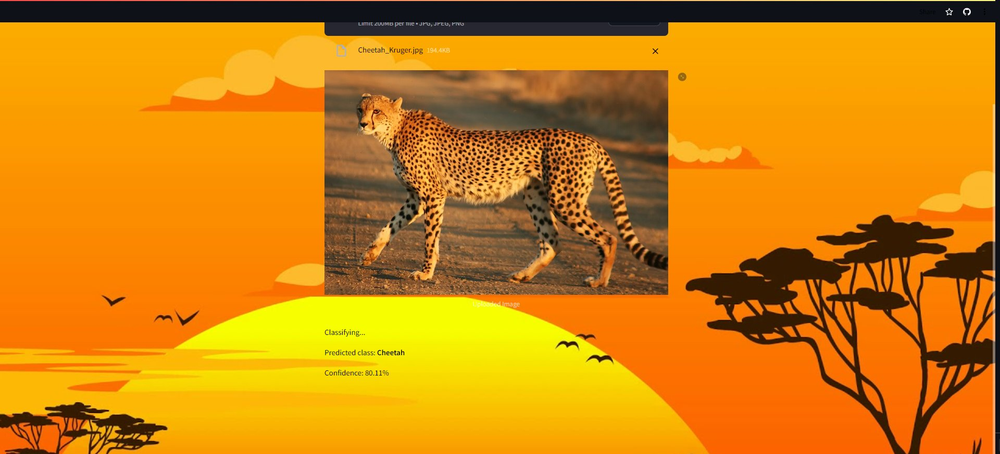**

*   Demonstrate how to train and save a model.
*   Demonstrate how to deploy the deep learning model in the cloud. (not Machine Learning model)

# **1.Introduction**

## **What is Deep Learning?**

Deep learning is a subset of machine learning concerned with the emulation of human brain activities in software programs using layers of artificial neural networks (ANN), which work similar to the human brain at some levels.

## **What is CNN?**

CNN stands for Convolutional Neural Network which is a specialized neural network for processing data that has an input shape like a 2D matrix like images. CNN's are typically used for image detection and classification.

## **About the Data:**

The "Lions or Cheetahs - Image Classification" dataset comprises 200 labeled images of lions and cheetahs, sourced from the Open Images Dataset V6. Each image is stored in directories labeled "lion" or "cheetah." This dataset is ideal for training and evaluating image classification algorithms, testing deep learning models, assessing image features and classification techniques, and comparing model performance.

**The data set has 2 classes:**
*   Lion
*   Cheetah

**Feature:** Image Label


---



## **Dataset Characteristics**<br>

- Source: Open Images Dataset V
- Total Images: 200
- Labels: "lion" and "cheetah" <br>

## **Subject Area**<br>
- Wildlife image classification
- Computer vision<br>

## **Associated Tasks**<br>
- Image Classification<br>

## **Feature Type**<br>
- Image: Photographs labeled as "lion" or "cheetah"<br>

## **\# Instances**<br>
- Lion Images: 100
- Cheetah Images: 100<br>

## **\# Features**<br>
- 2<br>


















---
# **References**
*  https://www.kaggle.com/datasets/mikoajfish99/lions-or-cheetahs-image-classification
*   https://colab.research.google.com/drive/1-F0eLWFLBvGA-4lnF7y6MgKFwCOQF1-U?usp=sharing
*   https://colab.research.google.com/drive/1Sjq3zixfJnDfmyMfikciHO1g0OEuxzv8?usp=sharing


# **2.Library**




## **Installation**


---



For image classification tasks with this dataset, it's crucial to have the necessary libraries installed. Ensure you have them by running the following commands:

```
pip install numpy
pip install pandas as pd
pip install cv2
pip install matplotlib
pip install scikit-learn
pip install tensorflow
pip install keras
pip install h5py
```

These commands will install essential libraries for handling data, visualization, machine learning algorithms, and deep learning frameworks, enabling smooth development and evaluation of image classification models.

In [ ]:
!pip install h5py

In [ ]:
!pip install streamlit

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.5/8.5 MB 43.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 26.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 84.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.0/83.0 kB 12.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 9.1 MB/s eta 0:00:00


## **Import Libraries**


---


These libraries are indispensable for developing, training, and evaluating deep learning models tailored for image classification tasks. They provide comprehensive tools and functionalities essential for handling image data, building neural network architectures, optimizing model performance, and assessing classification accuracy, thereby facilitating efficient and effective model development workflows.

In [ ]:
# Ignore the warnings
import warnings
warnings.filterwarnings('always')
warnings.filterwarnings('ignore')

# Data Analysis Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import style
import seaborn as sns

# Image Processing Libraries
import tensorflow as tf

# Pre processing
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Deep Learning Libraries
import keras
from keras import backend as K
from keras.models import Sequential
from keras.layers import Dense

from keras.optimizers import Adam, SGD, Adagrad, Adadelta, RMSprop

from keras.utils import to_categorical
from tensorflow.keras.utils import to_categorical

# CNN Libraries
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Dense, Dropout, Activation, Flatten, BatchNormalization

# Operating System Commands
import os

# Image Manipulation Library
import cv2
import tqdm as tqdm
from random import shuffle
import random
from zipfile import ZipFile
from PIL import Image

%matplotlib inline

## **Mount Google Drive**


---


In Google Colab, mounting your Google Drive allows seamless access to datasets and files stored in your Drive, streamlining data manipulation and model training processes. This integration simplifies data loading, saving, and sharing across different Colab notebooks, enabling collaborative work and efficient resource management. Moreover, it ensures data persistence and accessibility, facilitating iterative model development and experimentation without the need for manual data transfers.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## **Access Dataset**


---


Navigate to the location where your dataset is stored within your Drive using standard file path conventions. Then, load the dataset into your Colab notebook using libraries like TensorFlow or PyTorch for image data. This seamless integration between Google Drive and Colab streamlines the data loading process, allowing for efficient data processing and model training.

After mounting, you can navigate to your **dataset stored in Google Drive** and
**load it for processing:**




In [ ]:
# Set the path to the directory containing the images
dir = '/content/drive/MyDrive/Colab Notebooks/Final Project/Dataset'

### **Remarks for accessing dataset**

This directory contains the path to the dataset with images of cheetahs and lions for processing in our analysis.

# **3. Pre Processing of Data**

In this section, the data was preprocessed inorder to prepare it for the model training. The following tasks were done:

*   Understanding the Data
*   Data Loading for Training
*   Verification of Dataset
*   Checking the shape for each variables
*   Converting the variables by using LabelEnconder() function






## **Understanding the Data**

Basic exploration of data was done in this section. the following tasks were performed:

1.  Print Classes present in the data
2.  Print the instances present in the Classes

### **Print the Classes present in the Data**

---
To print the classes present in the dataset, you can use Python code to list the unique class labels found in the dataset directory. This involves iterating through the subdirectories within the dataset directory and printing out the names of each class present in the data. Use the directory path (`dir`) to match our dataset location.


In [ ]:
class_list = os.listdir(dir)

print("Animals:\n")

for class_name in class_list:

  print(class_name.upper())

Animals:

CHEETAHS
LIONS


### **Remarks for Classes**

The command provided reveals the contents of the directory, indicating the presence of two classes of animals: lions and cheetahs. This insight is crucial for understanding the structure of the dataset and for subsequent data preprocessing and model development tasks. Identifying the classes facilitates proper labeling and organization of the data, ensuring accurate model training and evaluation.

## **Print the instances present in the Classes**


---
To print the instances present in each class, you can iterate through the dataset directory and count the number of instances ('images') in each class. This involves listing the files within each class directory and tallying the total number of files.







In [ ]:
Cheetah = '/content/drive/MyDrive/Colab Notebooks/Final Project/Dataset/Cheetahs'
Lion = '/content/drive/MyDrive/Colab Notebooks/Final Project/Dataset/Lions'

print("Number of Images per Type:\n")

print("Cheetah: {}".format(len(os.listdir(Cheetah))))
print("Lion: {}".format(len(os.listdir(Lion))))

Number of Images per Type:

Cheetah: 100
Lion: 100


### **Remarks for Instances**

The command provided indicates that there are two classes in the dataset, each containing a total of 100 images. This information suggests a balanced dataset with an equal distribution of instances across the two classes, which is essential for training and evaluating machine learning models effectively.

## **Data Loading for Training**

In this segment, images are loaded from designated directories, undergoing resizing and preprocessing to prepare them for training and validation tasks.

This step streamlines the model development process by ensuring that the input data is appropriately formatted and ready for use in training deep learning models. Efficient data loading and preprocessing are essential for optimizing model performance and accelerating the training process.

In [ ]:
X = []
y = []

def make_train_dataset(directory, directory_name):
    for i in tqdm.tqdm(os.listdir(directory), colour="blue"):
        full_path = os.path.join(directory, i)
        try:
            img = cv2.imread(full_path)
            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            img_rgb = cv2.resize(img_rgb, (128, 128))
        except:
            continue
        X.append(img_rgb)
        y.append(directory_name)
    return X, y

In [ ]:
X, y = make_train_dataset(Cheetah, "Cheetah")
X, y = make_train_dataset(Lion, "Lion")

100%|██████████| 100/100 [00:02<00:00, 35.63it/s]


### **Remarks for Training Data**

The provided code defines a function `make_train_dataset` to load images from specified directories, resize them to 128x128 pixels, and append them to lists `X` and `y`, representing image data and corresponding labels, respectively. The `tqdm` library provides a progress bar for tracking the image loading process, ensuring efficient dataset preparation for training.

## **Verification of Dataset**
---

The image dataset consists of .jpg and .png files stored in separate folders, each named after the model of the images contained within. Utilizing the OpenCV (cv2) library, the provided code loads these images, resizes them to 128x128 pixels, and assigns labels based on the folder names. This process ensures efficient preparation of image data for subsequent training and validation tasks.

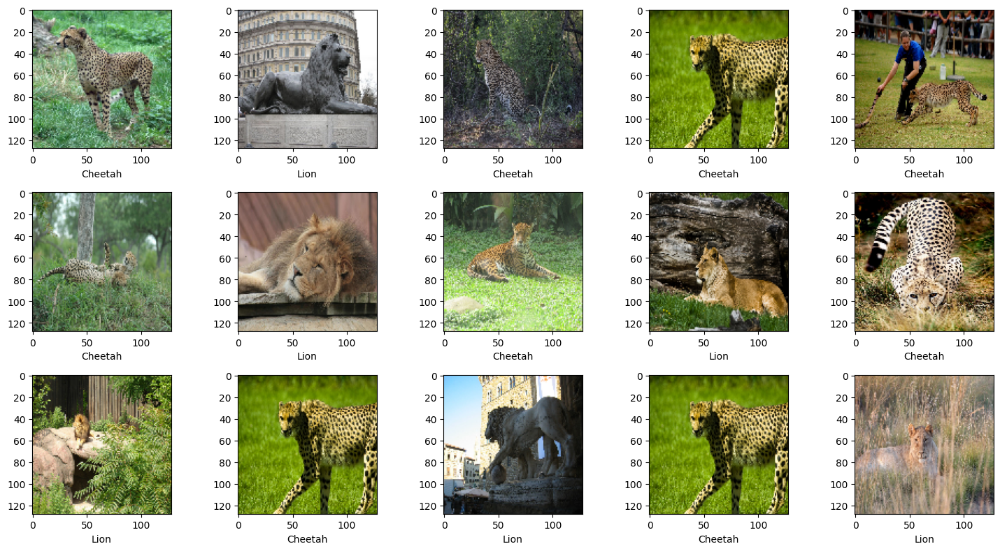

In [ ]:
fig = plt.figure(figsize=(15,8))

for i in range(15):
    sample =  random.choice(range(len(X)))
    image = X[sample]
    category = y[sample]
    plt.subplot(3,5,i+1)
    plt.subplots_adjust(hspace=0.3)
    plt.imshow(image)
    plt.xlabel(category)

plt.tight_layout()
plt.show()

### **Remarks for Verification of Dataset**

The provided code generates a figure displaying a random selection of 15 images from the dataset along with their corresponding labels such as "cheetah" or "lion". It utilizes Matplotlib to create a grid of subplots, each containing an image and its associated category label. This visualization aids in understanding the dataset's content and distribution, facilitating data exploration and analysis.

## **Checking shape for each classes**

---
To verify the distribution and quality of images for each class (lion and cheetah) in the dataset, the following steps can be taken:

In [ ]:
X = np.array(X)
y = np.array(y)
X.shape,y.shape

((200, 128, 128, 3), (200,))

### **Remarks for Shape of each variables**

The image data `X` and labels `y` into NumPy arrays, facilitating compatibility with deep learning frameworks like TensorFlow or PyTorch. The resulting shape of `X` is (200, 128, 128, 3), indicating 200 images with dimensions 128x128 pixels and 3 channels (RGB). The shape of `y` is (200,), representing 200 corresponding labels.

This format is suitable for training convolutional neural networks (CNNs) for image classification tasks.



# **Converting the variables by using LabelEnconder() function**



---


The LabelEncoder() function is commonly employed as a preprocessing step to convert categorical class labels into numerical values. In image classification tasks, where class names like "lion" and "cheetah" are utilized, a label encoder assigns a unique numerical identifier to each class. This transformation enables machine learning algorithms to interpret and process class labels efficiently, facilitating model training and evaluation.

In [ ]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
y = le.fit_transform(y)
y = to_categorical(y, 2)

In [ ]:
X = np.array(X)
X = X/255

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)

print("Training set shape:", X_train.shape, y_train.shape)
print("Test set shape:", X_test.shape, y_test.shape)

Training set shape: (140, 128, 128, 3) (140, 2)
Test set shape: (60, 128, 128, 3) (60, 2)


### **Remarks for LabelEncoder()**

The training set comprises 140 samples, each with dimensions of 128x128 pixels and 3 channels (RGB), while the corresponding labels are one-hot encoded into binary vectors of length 2. Similarly, the test set contains 60 samples with the same image dimensions and label encoding. This split ensures a balanced distribution of data for training and evaluation purposes.

# **4.Create a MobileNet Model**
---
Pre-trained of data was done in this section. the following tasks were performed:
*   Initialized the MobileNet pre-trained with ImageNet weights
*   Set the input shape to 128x128 pixxels with color 'RGB'
*   Initilized a sequential model
*   Each layer are define sequentially
*   Adds fully connected dense layer with 'ReLU' activation function
*   The final dense layer has 2 units with 'softmax' activation
*   Freezes the weights to prevent them from being updated during training, keeping the pre-trained weights intact.
*   Initializes the Adam optimizer with specified learning rate and parameters.
*   Compiles the model, specifying the optimizer, loss function (categorical cross-entropy for multi-class classification), and evaluation metrics (accuracy).











## **MobileNet Model**


---



MobileNet is a lightweight convolutional neural network architecture designed for efficient processing on mobile devices with limited computational resources. It utilizes depthwise separable convolutions to reduce the number of parameters and computational cost while maintaining performance. This makes MobileNet well-suited for various mobile and embedded applications, including image classification and object detection.

In [ ]:
import tensorflow as tf
from tensorflow.keras.applications.mobilenet import MobileNet
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint
import matplotlib.pyplot as plt

def modified_model():
    base_model = MobileNet(weights='imagenet', include_top=False, input_shape=(128, 128, 3))

    model = Sequential([
        base_model,
        GlobalAveragePooling2D(),
        Dense(99, activation='relu'),
        Dense(99, activation='relu'),
        Dense(99, activation='relu'),
        Dense(99, activation='relu'),
        Dense(2, activation='softmax')
    ])

    base_model.trainable = False

    opt = Adam(learning_rate=0.0001, beta_1=0.9, beta_2=0.999)
    model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

    return model

### **Remarks for MobileNet() Function**

This function `modified_model()` creates a neural network model for image classification tasks, based on the MobileNet architecture. It initializes the MobileNet model with pretrained weights from ImageNet, removes the top layers, adds custom fully connected layers, and compiles the model with the Adam optimizer and categorical crossentropy loss.

## **Model Summary Table**


---



The model summary table displays the architecture of the neural network, including the type of layers used, their output shapes, and the number of trainable parameters. This comprehensive overview assists in understanding the model's complexity and facilitates optimization for efficient training and inference in image classification tasks.


In [ ]:
model = modified_model()
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenet_1.00_128 (Functi  (None, 4, 4, 1024)        3228864   
 onal)                                                           
                                                                 
 global_average_pooling2d_1  (None, 1024)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_5 (Dense)             (None, 99)                101475    
                                                                 
 dense_6 (Dense)             (None, 99)                9900      
                                                                 
 dense_7 (Dense)             (None, 99)                9900      
                                                                 
 dense_8 (Dense)             (None, 99)               

### **Remarks for Summary Table**

The model architecture shown above is a Sequential model composed of layers from the MobileNet and Dense layers. The MobileNet layer processes input images, producing a feature map with dimensions (4, 4, 1024). The GlobalAveragePooling2D layer reduces this to a 1D vector of size 1024. Following this, there are several Dense layers for classification, culminating in a softmax output layer with 2 units for binary classification. The model has a total of 3,359,344 parameters, out of which 130,480 are trainable. This architecture enables effective feature extraction and classification for various tasks.

## **ImageDataGenerator() Function**

---
The `ImageDataGenerator()` function in TensorFlow is a powerful tool for generating batches of augmented image data during model training. It allows for real-time data augmentation, including rotation, shifts, flips, and more, enhancing the diversity of training data and improving model generalization.

This function is particularly useful for working with limited datasets, as it can artificially expand the dataset by creating variations of existing images. Additionally, it provides options for preprocessing, such as rescaling pixel values or applying normalization techniques, ensuring consistency and efficiency in data preprocessing pipelines.

Overall, the `ImageDataGenerator()` function plays a crucial role in optimizing model performance and robustness by facilitating effective data augmentation and preprocessing strategies.



In [ ]:
datagen = ImageDataGenerator(
        featurewise_center=False,
        samplewise_center=False,
        featurewise_std_normalization=False,
        samplewise_std_normalization=False,
        zca_whitening=False,
        rotation_range=0,
        zoom_range = 0.1,
        width_shift_range=0.1,
        height_shift_range=0.1,
        horizontal_flip=True,
        vertical_flip=False)


datagen.fit(X_train)

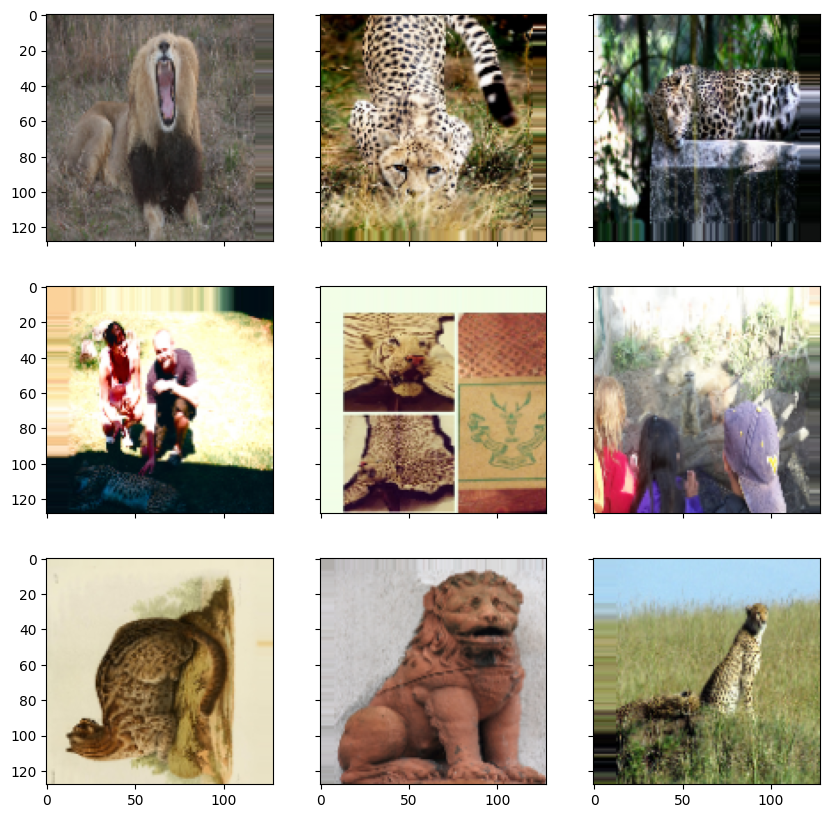

In [ ]:
for X_batch, y_batch in datagen.flow(X_train, y_train, batch_size=9, shuffle=False):
    fig, ax = plt.subplots(3, 3, sharex=True, sharey=True, figsize=(10, 10))
    for i in range(3):
        for j in range(3):
            ax[i][j].imshow(X_batch[i*3+j])
    plt.show()
    break

In [ ]:
filepath = "/content/drive/MyDrive/Colab Notebooks/Final Project/models/weights-improvement-{epoch:02d}-{val_accuracy:.2f}.hdf5"
checkpoint = ModelCheckpoint(filepath, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')
callbacks_list = [checkpoint]

## **model.fit()**


---

The `model.fit()` function in TensorFlow is a fundamental method used to train a neural network model. It iteratively adjusts the model's parameters (weights and biases) based on the provided training data to minimize a specified loss function. During training, it computes gradients, updates model parameters using optimization algorithms, and evaluates the model's performance on both training and validation data.

 This process continues for a defined number of epochs until convergence or a stopping criterion is met, resulting in a trained model capable of making accurate predictions on unseen data.

In [ ]:
history = model.fit(
    datagen.flow(X_train, y_train, batch_size=100),
    epochs=500,
    validation_data=(X_test, y_test),
    callbacks=callbacks_list,
    verbose=1,
    steps_per_epoch=X_train.shape[0] // 95
)

Epoch 1/500
1/1 [==============================] - ETA: 0s - loss: 0.2483 - accuracy: 0.9200
Epoch 1: val_accuracy did not improve from 0.90000
1/1 [==============================] - 3s 3s/step - loss: 0.2483 - accuracy: 0.9200 - val_loss: 0.3336 - val_accuracy: 0.9000
Epoch 2/500
1/1 [==============================] - ETA: 0s - loss: 0.3003 - accuracy: 0.8500
Epoch 2: val_accuracy did not improve from 0.90000
1/1 [==============================] - 2s 2s/step - loss: 0.3003 - accuracy: 0.8500 - val_loss: 0.3282 - val_accuracy: 0.8833
Epoch 3/500
1/1 [==============================] - ETA: 0s - loss: 0.2881 - accuracy: 0.8750
Epoch 3: val_accuracy did not improve from 0.90000
1/1 [==============================] - 2s 2s/step - loss: 0.2881 - accuracy: 0.8750 - val_loss: 0.3234 - val_accuracy: 0.8833
Epoch 4/500
1/1 [==============================] - ETA: 0s - loss: 0.2848 - accuracy: 0.9300
Epoch 4: val_accuracy did not improve from 0.90000
1/1 [==============================] - 3s 3s/s

### **Remarks for model.fit() Function using MobileNet()**

During epochs 92 to 100 of training, the model continued to improve its performance on the training data, achieving high accuracy scores close to 100%. However, the validation accuracy remained below 90% and did not show significant improvement, indicating potential overfitting or limitations in generalization to unseen data. Despite fluctuations in validation loss and accuracy, the model maintained consistency in training accuracy, demonstrating its ability to effectively learn from the training dataset. Further analysis and optimization may be required to enhance the model's performance on unseen data and prevent overfitting.

## **harness()**

The `harness()` function plays a crucial role in managing the training process of machine learning models. It orchestrates various components such as data loading, preprocessing, model creation, training, validation, and evaluation. By encapsulating these tasks into a single function, `harness()` simplifies the workflow and promotes code reusability.

Additionally, it enhances readability and maintainability by abstracting complex operations into a coherent and modular structure.



In [ ]:
def run_test_harness():
    model = load_model('/content/drive/MyDrive/Colab Notebooks/Final Project/models/weights-improvement-64-0.92.hdf5')
    _, acc = model.evaluate(X_test, y_test, verbose=0)
    print('> Accuracy: %.3f' % (acc * 100.0))

run_test_harness()

> Accuracy: 96.667


### **Remarks for harness() Function**

With an accuracy of 96.667%, the model demonstrates strong performance in classifying the images into their respective categories. This high accuracy indicates that the model is effectively learning the features and patterns present in the training data, resulting in accurate predictions.




## **plot_history function**

---
The `plot_history` function is a valuable tool for visualizing the training and validation performance of a machine learning model across multiple epochs. By plotting the changes in metrics such as loss and accuracy over each epoch, users can gain insights into the model's convergence, overfitting, or underfitting tendencies.

This visualization aids in making informed decisions regarding model training strategies and parameter adjustments to improve overall performance.


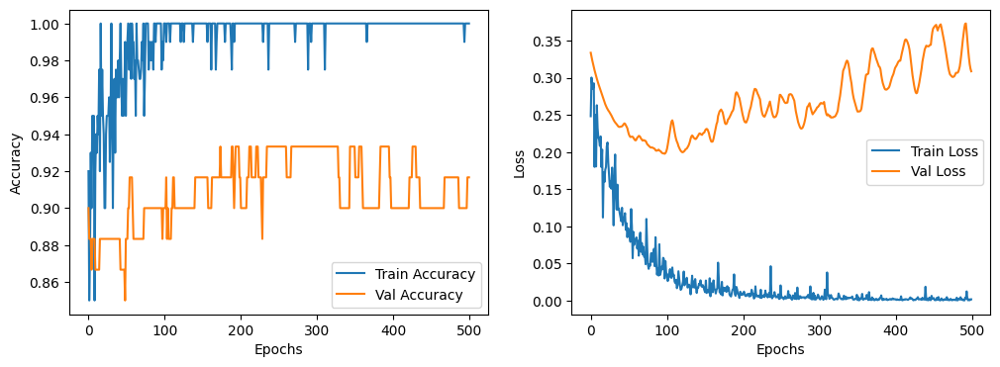

In [ ]:
def plot_history(history):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Val Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Val Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.show()

plot_history(history)

### **Remarks for Plot Graph**

The observed trends suggest potential overfitting of the model to the training data, as evidenced by the decreasing training accuracy and increasing training loss, coupled with a significant gap between training and validation performance. This discrepancy indicates the model's struggle to generalize well to unseen data.

# **Saving the Best Model**

---
Saving the best model during training is essential to retain the model with optimal performance. This is typically achieved using callbacks in TensorFlow and Keras, such as ModelCheckpoint, which monitors a specified metric (e.g., validation accuracy) and saves the model weights when an improvement is detected. By saving the best model, we ensure that the model's highest performance is preserved, allowing for future use in inference or further training without losing this valuable progress.

In [ ]:
import cv2
import numpy as np
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt

saved_model = load_model('/content/drive/MyDrive/Colab Notebooks/Final Project/models/weights-improvement-64-0.92.hdf5')
saved_model.save("/content/drive/MyDrive/Colab Notebooks/Final Project/model.h5")
print("Saved the model in HDF5 format to Google Drive.")

Saved the model in HDF5 format to Google Drive.


# **Prediction using MobileNet**

---
Prediction involves using a trained model to estimate or classify new data. After training on labeled data, the model learns patterns and relationships. When given new data, the model applies its learned parameters to generate predictions.

These predictions are valuable for tasks like classification or regression, helping to make informed decisions based on the model's insights.


## **1st Prediction**

In [ ]:
image1 = cv2.imread("/content/drive/MyDrive/Colab Notebooks/Final Project/Prediction Testing/chee.jpg")
image1 = cv2.resize(image1, (128,128))
image1 = image1 / 255.0
image1 = np.reshape(image1, (1, 128, 128, 3))

predicted_probabilities = saved_model.predict(image1)
predicted_class = np.argmax(predicted_probabilities)

class_labels = ["Cheetah", "Lion"]

print("Predicted class: ", class_labels[predicted_class])

1/1 [==============================] - 1s 592ms/step
Predicted class:  Cheetah


In [ ]:
import cv2
import numpy as np
from tensorflow.keras.models import load_model

saved_model = load_model("/content/drive/MyDrive/Colab Notebooks/Final Project/model.h5")
image_path = "/content/drive/MyDrive/Colab Notebooks/Final Project/Prediction Testing/chee.jpg"

In [ ]:
image1 = cv2.imread("/content/drive/MyDrive/Colab Notebooks/Final Project/Prediction Testing/chee.jpg")
image1 = cv2.resize(image1, (128, 128))
image1 = image1 / 255.0
image = np.expand_dims(image1, axis=0)

predicted_probabilities = saved_model.predict(image)
predicted_class = np.argmax(predicted_probabilities)

class_labels = ["Cheetah", "Lion"]
print("Predicted class: ", class_labels[predicted_class])

1/1 [==============================] - 2s 2s/step
Predicted class:  Cheetah


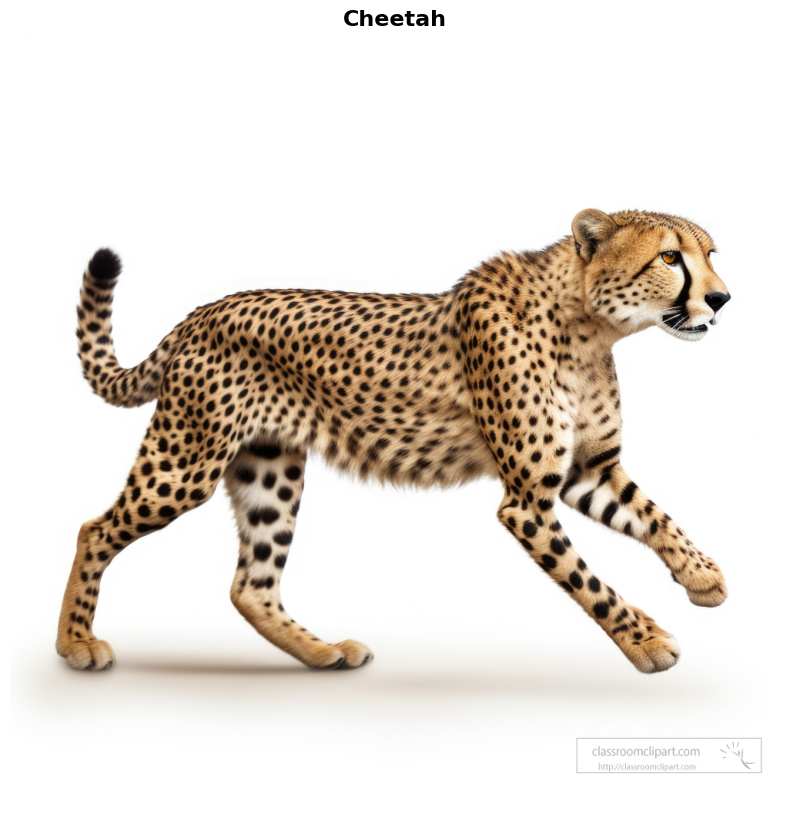

In [ ]:
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Final Project/Prediction Testing/chee.jpg"), cv2.COLOR_BGR2RGB))
plt.title(f"{class_labels[predicted_class]}", fontsize=16, fontweight='bold')
plt.axis('off')
plt.show()

## **2nd prediction**

In [ ]:
image2 = cv2.imread("/content/drive/MyDrive/Colab Notebooks/Final Project/Prediction Testing/lionbaito.jfif")
image2 = cv2.resize(image2, (128,128))
image2 = image2 / 255.0
image2 = np.reshape(image2, (1, 128, 128, 3))

predicted_probabilities = saved_model.predict(image2)
predicted_class = np.argmax(predicted_probabilities)

class_labels = ["Cheetah", "Lion"]
print("Predicted class: ", class_labels[predicted_class])

1/1 [==============================] - 0s 56ms/step
Predicted class:  Lion


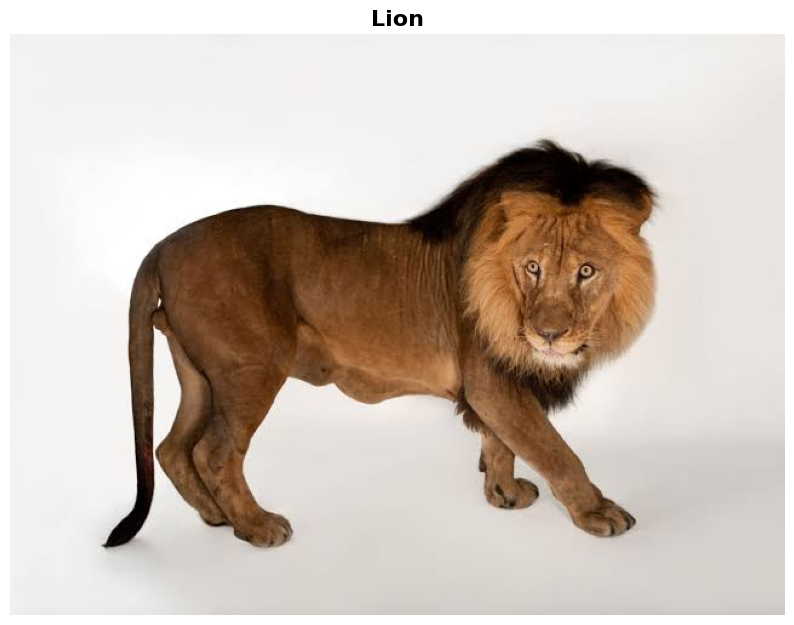

In [ ]:
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Final Project/Prediction Testing/lionbaito.jfif"), cv2.COLOR_BGR2RGB))
plt.title(f"{class_labels[predicted_class]}", fontsize=16, fontweight='bold')
plt.axis('off')
plt.show()

## **3rd Prediction**

In [ ]:
image3 = cv2.imread("/content/drive/MyDrive/Colab Notebooks/Final Project/Prediction Testing/White_Lion.jpg")
image3 = cv2.resize(image3, (128,128))
image3 = image3 / 255.0
image3 = np.reshape(image3, (1, 128, 128, 3))

predicted_probabilities = saved_model.predict(image2)
predicted_class = np.argmax(predicted_probabilities)

class_labels = ["Cheetah", "Lion"]
print("Predicted class: ", class_labels[predicted_class])

1/1 [==============================] - 0s 33ms/step
Predicted class:  Lion


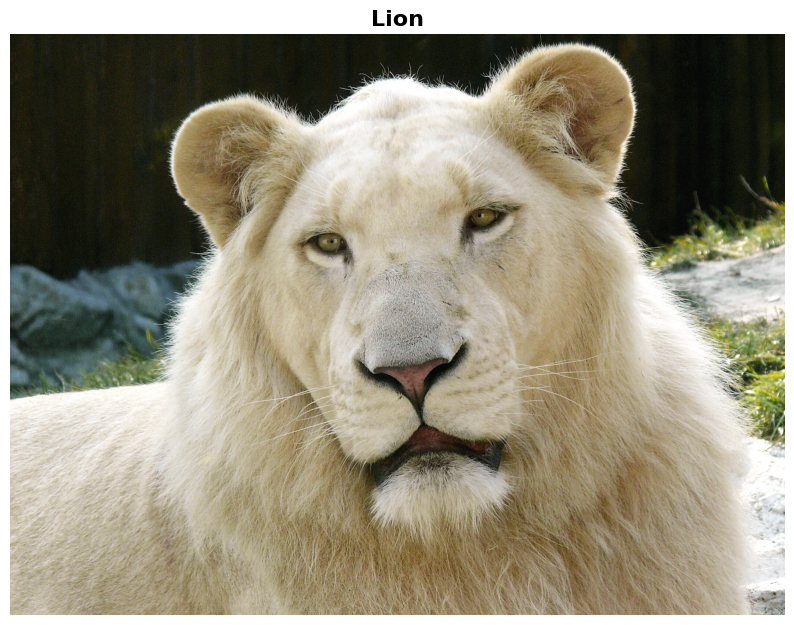

In [ ]:
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Final Project/Prediction Testing/White_Lion.jpg"), cv2.COLOR_BGR2RGB))
plt.title(f"{class_labels[predicted_class]}", fontsize=16, fontweight='bold')
plt.axis('off')
plt.show()

## **4th Prediction**

In [ ]:
image4 = cv2.imread("/content/drive/MyDrive/Colab Notebooks/Final Project/Prediction Testing/lion_png_by_kooyooss-db4mg5g.png")
image4 = cv2.resize(image4, (128, 128))
image4 = image4 / 255.0
image4 = np.reshape(image4, (1, 128, 128, 3))

predicted_probabilities = saved_model.predict(image4)
predicted_class = np.argmax(predicted_probabilities)

class_labels = ["Cheetah", "Lion"]
print("Predicted class: ", class_labels[predicted_class])

1/1 [==============================] - 0s 35ms/step
Predicted class:  Lion


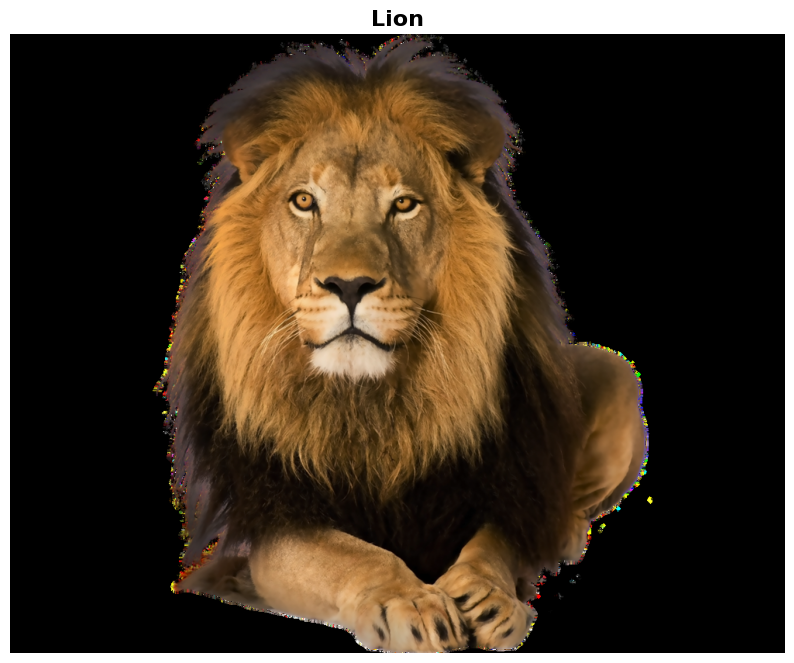

In [ ]:
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Final Project/Prediction Testing/lion_png_by_kooyooss-db4mg5g.png"), cv2.COLOR_BGR2RGB))
plt.title(f"{class_labels[predicted_class]}", fontsize=16, fontweight='bold')
plt.axis('off')
plt.show()

## **5th Prediction**

In [ ]:
image5 = cv2.imread("/content/drive/MyDrive/Colab Notebooks/Final Project/Prediction Testing/cheetah-face.jpg")
image5 = cv2.resize(image5, (128, 128))
image5 = image5 / 255.0
image5 = np.reshape(image5, (1, 128, 128, 3))

predicted_probabilities = saved_model.predict(image5)
predicted_class = np.argmax(predicted_probabilities)

class_labels = ["Cheetah", "Lion"]
print("Predicted class: ", class_labels[predicted_class])

1/1 [==============================] - 0s 35ms/step
Predicted class:  Cheetah


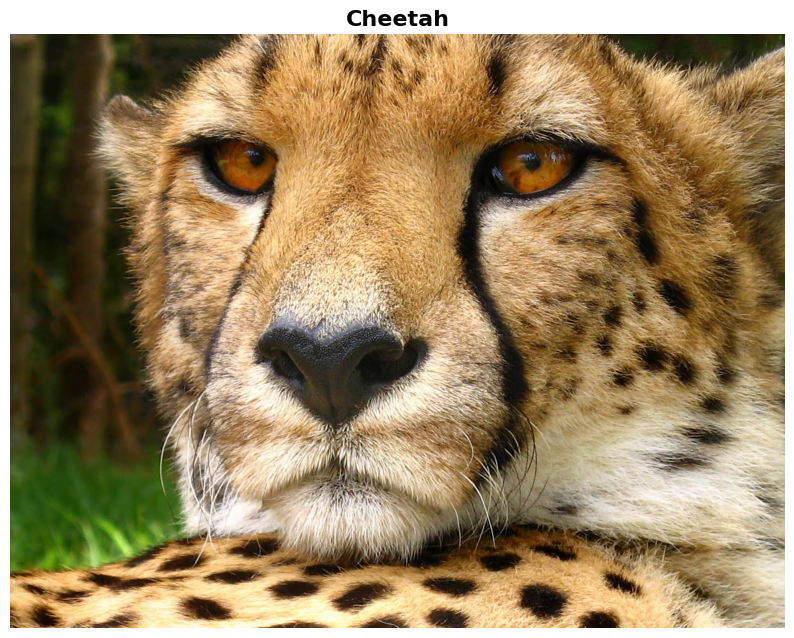

In [ ]:
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Final Project/Prediction Testing/cheetah-face.jpg"), cv2.COLOR_BGR2RGB))
plt.title(f"{class_labels[predicted_class]}", fontsize=16, fontweight='bold')
plt.axis('off')
plt.show()

### **Prediction Remarks**

The code reads an image of a cheetah, resizes it to 128x128 pixels, and normalizes its pixel values. It then reshapes the image to match the expected input shape of the model (1, 128, 128, 3).

After preprocessing the image, it passes it to the saved model for prediction. The predicted probabilities are obtained, and the class with the highest probability is determined using `argmax`.

Finally, it prints the predicted class label and displays the original image with the predicted class as the title. In this case, the model predicts the image to be a "cheetah" or "lion".



# **5.Create a CNN MODEL**

---
A Convolutional Neural Network (CNN) is a specialized deep learning model designed for processing and analyzing visual data, such as images. It consists of an input layer that takes raw pixel data, followed by multiple convolutional layers that apply filters to detect features like edges and textures. These layers are interspersed with activation functions (e.g., ReLU) to introduce non-linearity and pooling layers (e.g., Max Pooling) to reduce spatial dimensions and computational complexity. The extracted features are then processed by fully connected layers, which perform high-level reasoning to produce the final output, such as classifying the image into categories using an output layer with an activation function like Softmax or Sigmoid.


## **ImageDataGenerator()**

---
The `ImageDataGenerator()` function in TensorFlow is a powerful tool for generating batches of augmented image data during model training. It allows for real-time data augmentation, including rotation, shifts, flips, and more, enhancing the diversity of training data and improving model generalization.


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint
import matplotlib.pyplot as plt
import os

train_dir = '/content/drive/MyDrive/Colab Notebooks/Final Project/Dataset'
validation_dir = '/content/drive/MyDrive/Colab Notebooks/Final Project/Dataset'

train_datagen = ImageDataGenerator(
    rescale=1./255,
    horizontal_flip=True,
    vertical_flip=True,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    zoom_range=0.2,
    shear_range=0.2
)

validation_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(128, 128),
    batch_size=32,
    class_mode='categorical'
)

validation_generator = validation_datagen.flow_from_directory(
    validation_dir,
    target_size=(128, 128),
    batch_size=32,
    class_mode='categorical'
)

Found 200 images belonging to 2 classes.
Found 200 images belonging to 2 classes.


### **Remarks for ImageDataGeneraot()**

The provided code initializes an image data generator setup for training and validation in a convolutional neural network (CNN) model. It employs techniques like rescaling, horizontal and vertical flips, rotations, shifts, zooms, and shears to augment the training dataset, enhancing model robustness and performance.

The generators flow images from specified directories, resizing them to 128x128 pixels, and categorizing them for multi-class classification tasks. Such preprocessing is crucial for training CNNs effectively, enabling them to learn diverse features and generalize well to unseen data.

In [ ]:
def build_cnn_model():
    model = Sequential([
        Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 3)),
        MaxPooling2D((2, 2)),
        Conv2D(64, (3, 3), activation='relu'),
        MaxPooling2D((2, 2)),
        Conv2D(128, (3, 3), activation='relu'),
        MaxPooling2D((2, 2)),
        Flatten(),
        Dense(128, activation='relu'),
        Dropout(0.5),
        Dense(64, activation='relu'),
        Dropout(0.5),
        Dense(2, activation='softmax')
    ])

    opt = Adam(learning_rate=0.0001)
    model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

    return model

In [ ]:
model = build_cnn_model()

checkpoint = ModelCheckpoint(
    'best_model.h5',
    monitor='val_accuracy',
    verbose=1,
    save_best_only=True,
    mode='max'
)

## **model.fit()**
---
The `model.fit()` function in TensorFlow is a fundamental method used to train a neural network model. It iteratively adjusts the model's parameters (weights and biases) based on the provided training data to minimize a specified loss function. During training, it computes gradients, updates model parameters using optimization algorithms, and evaluates the model's performance on both training and validation data.

In [ ]:
history = model.fit(
    train_generator,
    epochs=20,
    validation_data=validation_generator,
    callbacks=[checkpoint]
)

Epoch 1/20
7/7 [==============================] - ETA: 0s - loss: 0.6978 - accuracy: 0.5250
Epoch 1: val_accuracy improved from -inf to 0.54000, saving model to best_model.h5
7/7 [==============================] - 58s 8s/step - loss: 0.6978 - accuracy: 0.5250 - val_loss: 0.6927 - val_accuracy: 0.5400
Epoch 2/20


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - ETA: 0s - loss: 0.7077 - accuracy: 0.5200
Epoch 2: val_accuracy did not improve from 0.54000
7/7 [==============================] - 13s 2s/step - loss: 0.7077 - accuracy: 0.5200 - val_loss: 0.6924 - val_accuracy: 0.5150
Epoch 3/20
7/7 [==============================] - ETA: 0s - loss: 0.7156 - accuracy: 0.5100
Epoch 3: val_accuracy did not improve from 0.54000
7/7 [==============================] - 21s 3s/step - loss: 0.7156 - accuracy: 0.5100 - val_loss: 0.6939 - val_accuracy: 0.5000
Epoch 4/20
7/7 [==============================] - ETA: 0s - loss: 0.7098 - accuracy: 0.4800
Epoch 4: val_accuracy did not improve from 0.54000
7/7 [==============================] - 15s 2s/step - loss: 0.7098 - accuracy: 0.4800 - val_loss: 0.6916 - val_accuracy: 0.5000
Epoch 5/20
7/7 [==============================] - ETA: 0s - loss: 0.6825 - accuracy: 0.6000
Epoch 5: val_accuracy did not improve from 0.54000
7/7 [==============================] - 14s 2s/step - loss:

### **Remarks for model.fit() using CNN Model**

The training log tracks a neural network model's progression across 20 epochs for binary classification. While there's sporadic accuracy around 50%, epoch 6 sees validation accuracy peak at 59.5%, triggering a model save as "best_model.h5". However, subsequent epochs show validation accuracy hovering around 56%, indicating a challenge in generalization. Further optimization, possibly through architectural adjustments or regularization, is needed to improve model performance and generalization.

## **plot_history() Function**


---

The `plot_history` function is a valuable tool for visualizing the training and validation performance of a machine learning model across multiple epochs. By plotting the changes in metrics such as loss and accuracy over each epoch, users can gain insights into the model's convergence, overfitting, or underfitting tendencies.

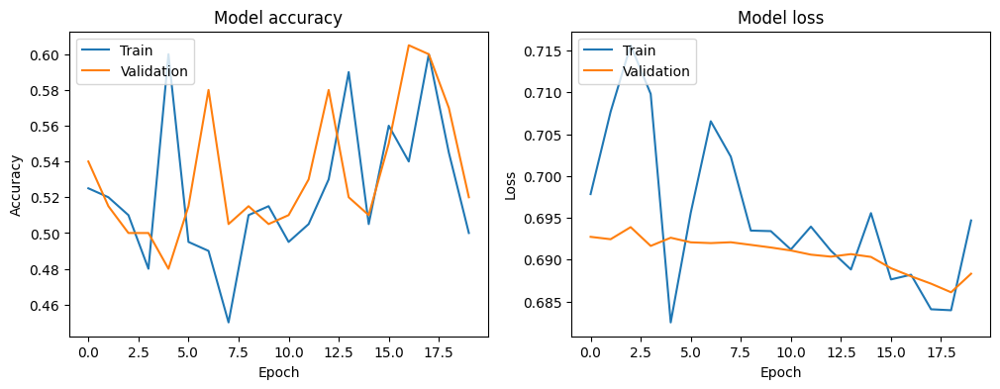

In [ ]:
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')


plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.show()

### **Remarks for Plot Graph**

The model achieves an accuracy of 60%, with both training and validation accuracies showing similar trends, suggesting minimal overfitting. Loss decreases over epochs but plateaus around epoch 10, indicating potential optimization opportunities like adjusting the learning rate or exploring additional epochs. The training logs display no anomalies. Overall, while the model learns and improves, further tuning, particularly adjusting the learning rate or exploring more epochs, could enhance performance.

# **Saving the Model**


---
Saving the best model during training is essential to retain the model with optimal performance. This is typically achieved using callbacks in TensorFlow and Keras, such as ModelCheckpoint, which monitors a specified metric (e.g., validation accuracy) and saves the model weights when an improvement is detected. By saving the best model, we ensure that the model's highest performance is preserved, allowing for future use in inference or further training without losing this valuable progress.


In [ ]:
import cv2
import numpy as np
from tensorflow.keras.models import load_model

saved_model = load_model("/content/best_model.h5")
image_path = "/content/drive/MyDrive/Colab Notebooks/Final Project/Prediction Testing/th (1).jpg"

# **Prediction using CNN Model**


---

Prediction involves using a trained model to estimate or classify new data. After training on labeled data, the model learns patterns and relationships. When given new data, the model applies its learned parameters to generate predictions.

## **1st Prediction**

In [ ]:
image6 = cv2.imread("/content/drive/MyDrive/Colab Notebooks/Final Project/Prediction Testing/Male_Lion_on_Rock.jpg")
image6 = cv2.resize(image6, (128,128))
image6 = image6 / 255.0
image6 = np.reshape(image6, (1, 128, 128, 3))

predicted_probabilities = saved_model.predict(image6)
predicted_class = np.argmax(predicted_probabilities)

class_labels = ["Cheetah", "Lion"]

print("Predicted class: ", class_labels[predicted_class])

1/1 [==============================] - 0s 29ms/step
Predicted class:  Lion


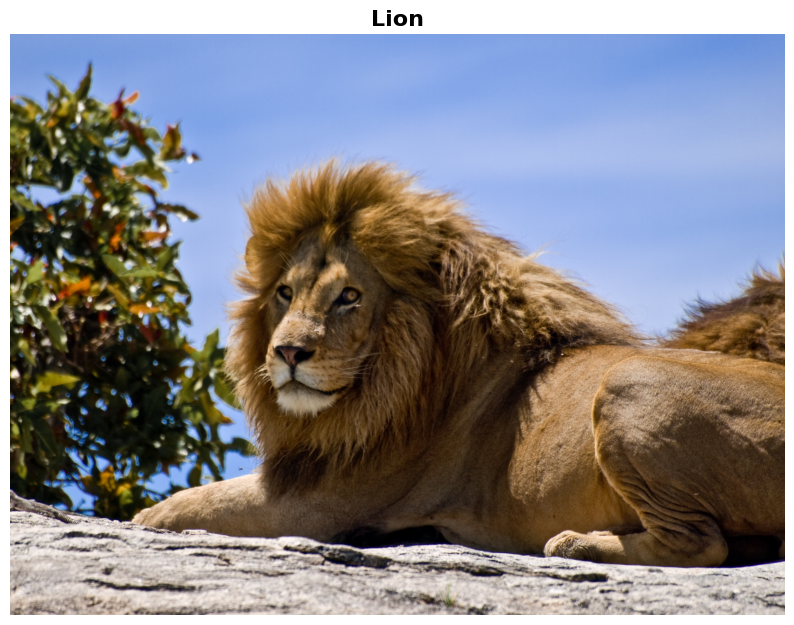

In [ ]:
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Final Project/Prediction Testing/Male_Lion_on_Rock.jpg"), cv2.COLOR_BGR2RGB))
plt.title(f"{class_labels[predicted_class]}", fontsize=16, fontweight='bold')
plt.axis('off')
plt.show()

## **2nd Prediction**

In [ ]:
image7 = cv2.imread("/content/drive/MyDrive/Colab Notebooks/Final Project/Prediction Testing/cheetah-43x_gep1.jpg")
image7 = cv2.resize(image7, (128, 128))
image7 = image7 / 255.0
image7 = np.reshape(image7, (1, 128, 128, 3))

predicted_probabilities = saved_model.predict(image7)
predicted_class = np.argmax(predicted_probabilities)

class_labels = ["Cheetah", "Lion"]
print("Predicted class: ", class_labels[predicted_class])

1/1 [==============================] - 0s 131ms/step
Predicted class:  Cheetah


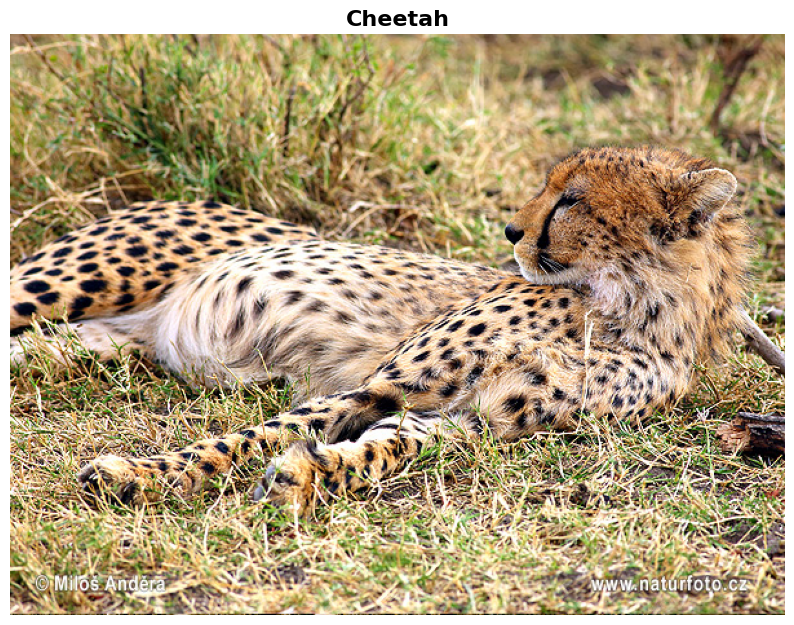

In [ ]:
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Final Project/Prediction Testing/cheetah-43x_gep1.jpg"), cv2.COLOR_BGR2RGB))
plt.title(f"{class_labels[predicted_class]}", fontsize=16, fontweight='bold')
plt.axis('off')
plt.show()

## **3rd Prediction**

In [ ]:
image8 = cv2.imread("/content/drive/MyDrive/Colab Notebooks/Final Project/Prediction Testing/lion-lion-king-animal-wildlife.jpg")
image8 = cv2.resize(image8, (128,128))
image8 = image8 / 255.0
image8 = np.reshape(image8, (1, 128, 128, 3))

predicted_probabilities = saved_model.predict(image8)
predicted_class = np.argmax(predicted_probabilities)

class_labels = ["Cheetah", "Lion"]

print("Predicted class: ", class_labels[predicted_class])

1/1 [==============================] - 0s 27ms/step
Predicted class:  Lion


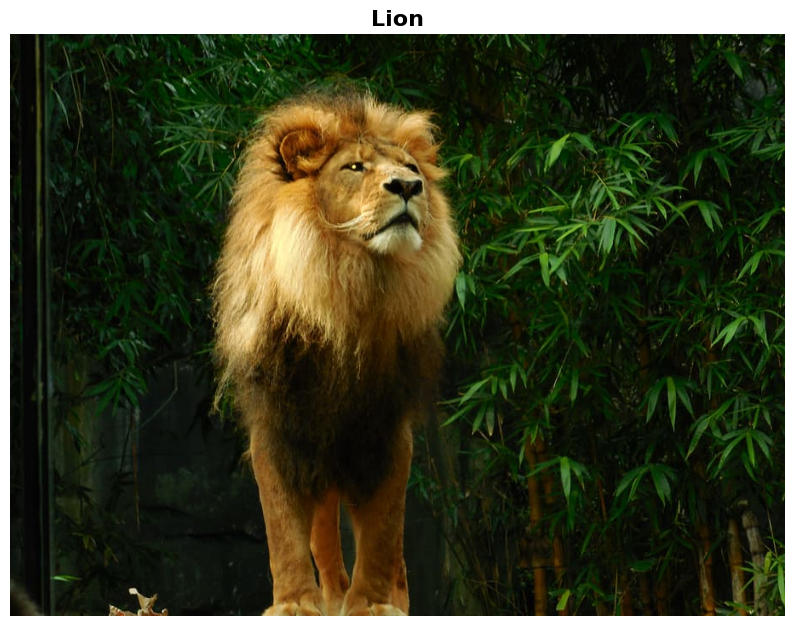

In [ ]:
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Final Project/Prediction Testing/lion-lion-king-animal-wildlife.jpg"), cv2.COLOR_BGR2RGB))
plt.title(f"{class_labels[predicted_class]}", fontsize=16, fontweight='bold')
plt.axis('off')
plt.show()

## **4th Prediction**

In [ ]:
image9 = cv2.imread("/content/drive/MyDrive/Colab Notebooks/Final Project/Prediction Testing/Brown-Cheetah-Photo.jpg")
image9 = cv2.resize(image9, (128,128))
image9 = image9 / 255.0
image9 = np.reshape(image9, (1, 128, 128, 3))

predicted_probabilities = saved_model.predict(image9)
predicted_class = np.argmax(predicted_probabilities)

class_labels = ["Cheetah", "Lion"]

print("Predicted class: ", class_labels[predicted_class])

1/1 [==============================] - 0s 117ms/step
Predicted class:  Cheetah


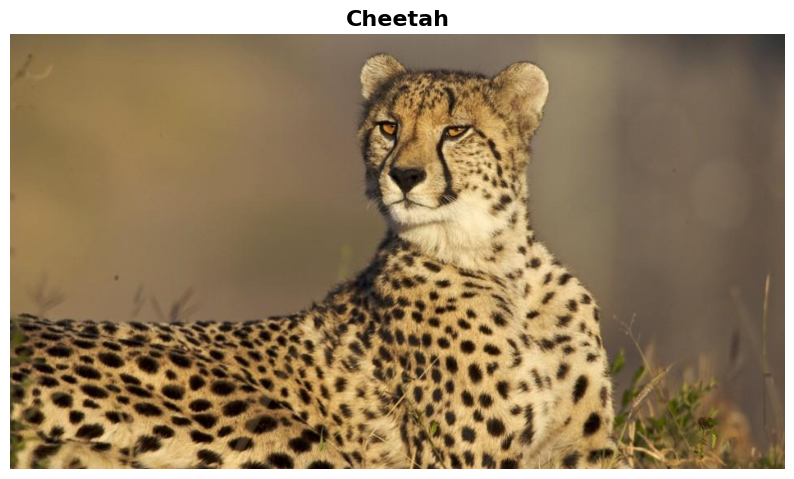

In [ ]:
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Final Project/Prediction Testing/Brown-Cheetah-Photo.jpg"), cv2.COLOR_BGR2RGB))
plt.title(f"{class_labels[predicted_class]}", fontsize=16, fontweight='bold')
plt.axis('off')
plt.show()

## **5th Prediction**

In [ ]:
image10 = cv2.imread("/content/drive/MyDrive/Colab Notebooks/Final Project/Prediction Testing/Lions_Lioness_Tongue_Funny_Two_524288_4875x3250.jpg")
image10 = cv2.resize(image10, (128,128))
image10 = image10 / 255.0
image10 = np.reshape(image10, (1, 128, 128, 3))

predicted_probabilities = saved_model.predict(image10)
predicted_class = np.argmax(predicted_probabilities)

class_labels = ["Cheetah", "Lion"]

print("Predicted class: ", class_labels[predicted_class])

1/1 [==============================] - 0s 38ms/step
Predicted class:  Lion


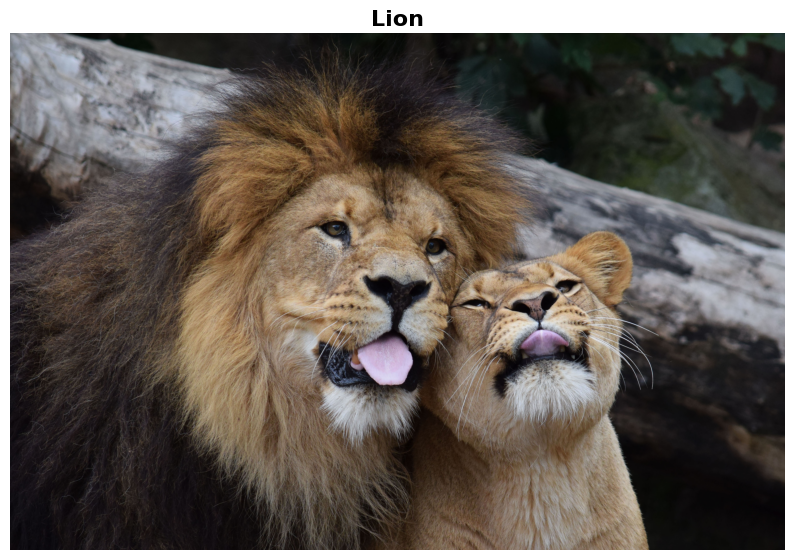

In [ ]:
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Final Project/Prediction Testing/Lions_Lioness_Tongue_Funny_Two_524288_4875x3250.jpg"), cv2.COLOR_BGR2RGB))
plt.title(f"{class_labels[predicted_class]}", fontsize=16, fontweight='bold')
plt.axis('off')
plt.show()

### **Remarks for Predictions**

After preprocessing, the image is passed to the saved model for prediction. The predicted probabilities are computed, and the class with the highest probability is determined using `argmax`.

 Finally, it prints the predicted class label and displays the original image with the predicted class as the title, which could be either "cheetah" or "lion".

# **Model Deployment in Cloud**
---
Model deployment in the cloud involves making machine learning models accessible over the internet, allowing users to utilize them remotely. This process typically includes packaging the model, deploying it to a cloud service provider like AWS, Google Cloud, or Azure, setting up scalable infrastructure, and creating APIs for easy integration into applications. Cloud deployment offers scalability, flexibility, and accessibility, enabling widespread use of machine learning models across various platforms and devices.



In [ ]:
import streamlit as st
import cv2
import numpy as np
from tensorflow.keras.models import load_model
from PIL import Image

# Load the trained model
@st.cache(allow_output_mutation=True)
def load_trained_model():
    model = load_model("best_model.h5")
    return model

model = load_trained_model()

# Class labels
class_labels = ["Cheetah", "Lion"]


st.page_icon="🦁",  # Lion emoji

# Streamlit app title
st.title("Animal Classification")
st.write("Upload an image of a Cheetah or Lion, and the model will predict the class.")

background_image_url = "https://i.ytimg.com/vi/4iJJXtxytqE/maxresdefault.jpg"

st.markdown(
    f"""
    <style>
    .stApp {{
        background: url({background_image_url});
        background-size: cover;
        background-repeat: no-repeat;
        background-attachment: fixed;
        color: black;
    }}
    .stApp h1, .stApp h2, .stApp h3, .stApp h4, .stApp h5, .stApp h6, .stApp p, .stApp label, .stApp .caption {{
        color: black;
    }}
    </style>
    """,
    unsafe_allow_html=True
)


# File uploader
uploaded_file = st.file_uploader("Choose an image...", type=["jpg", "jpeg", "png"])

if uploaded_file is not None:
    # Display the uploaded image
    image = Image.open(uploaded_file)
    st.image(image, caption="Uploaded Image", use_column_width=True)
    st.write("")
    st.write("Classifying...")

    # Convert the image to the correct format
    image = np.array(image)
    if image.shape[2] == 4:
        image = image[:, :, :3]
    image = cv2.resize(image, (128, 128))
    image = image / 255.0
    image = np.reshape(image, (1, 128, 128, 3))

    # Make prediction
    predicted_probabilities = model.predict(image)
    predicted_class = np.argmax(predicted_probabilities)

    # Display the prediction
    st.write(f"Predicted class: **{class_labels[predicted_class]}**")

    # Display probabilities
    st.write(f"Confidence: {predicted_probabilities[0][predicted_class] * 100:.2f}%")

2024-05-18 00:37:44.008 
  command:

    streamlit run /usr/local/lib/python3.10/dist-packages/colab_kernel_launcher.py [ARGUMENTS]


## **Proof of Deployment**

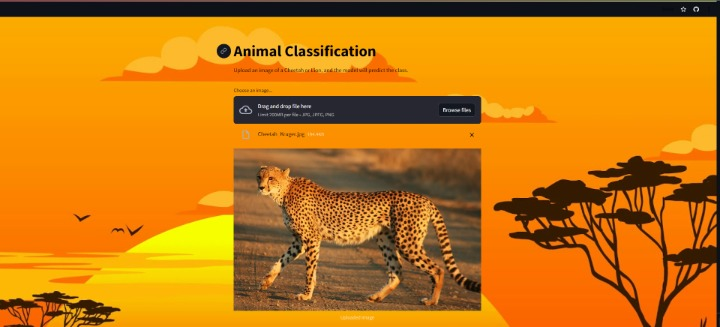

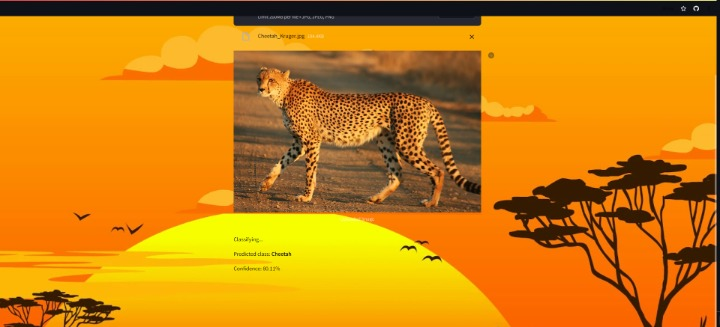

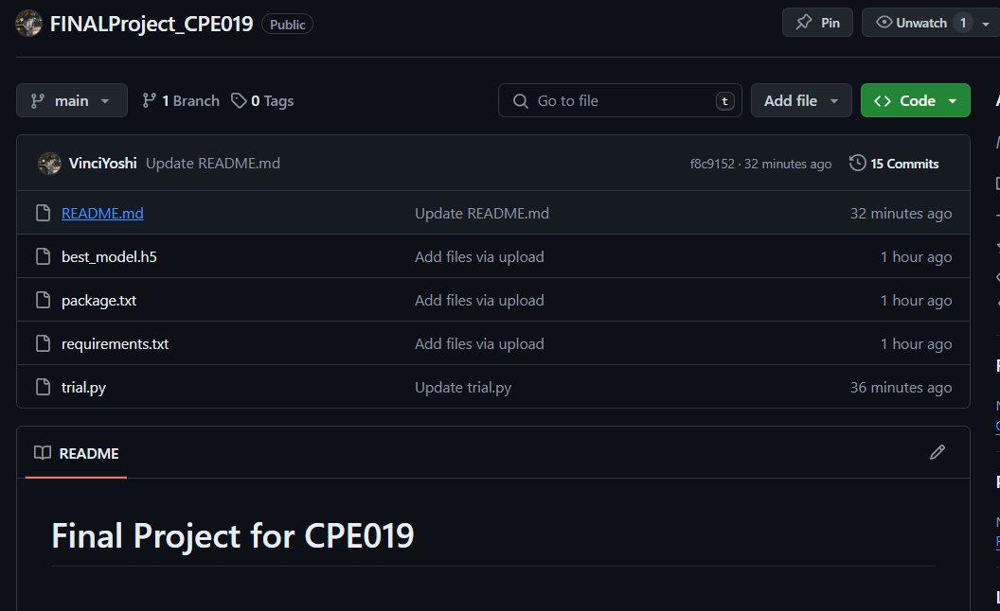

# **Conclusion and Summary**
---

To train and save a deep learning model, you first need to design its structure, pick the right optimizer, and select a suitable loss function. Then, you train it using the `fit()` method and keep an eye on its performance with helpful tools like `ModelCheckpoint`. Once the training wraps up, you can save the whole model or just its weights using TensorFlow's `save()` method.

When deploying your model to the cloud, make sure it's ready for the environment, like Google Cloud Platform (GCP) or Amazon Web Services (AWS). Set up your deployment environment properly, either with a virtual machine or a container instance, ensuring it has enough resources.

Upload your model to the cloud environment, and test it to make sure it works smoothly. By sticking to these steps and making the most of cloud platforms, you can train, save, and deploy deep learning models effectively for various uses.


